# Assignment 2 

Name: Metin

Surname:DEMİR

Student ID:21526902

# Part I: Theory Questions

# MLE

**1. Assume that you have a data consisting of x1,x2,...,xm where each xi represents a single real value, which means you have m instances in data and each instance has an single real-valued attribute. Assume also that the given data has random uniform distribution between −w and w. You are expected to ﬁnd the maximum likelihood estimate of w with respect to the given data.**

**• Specify a likelihood function F(w).**
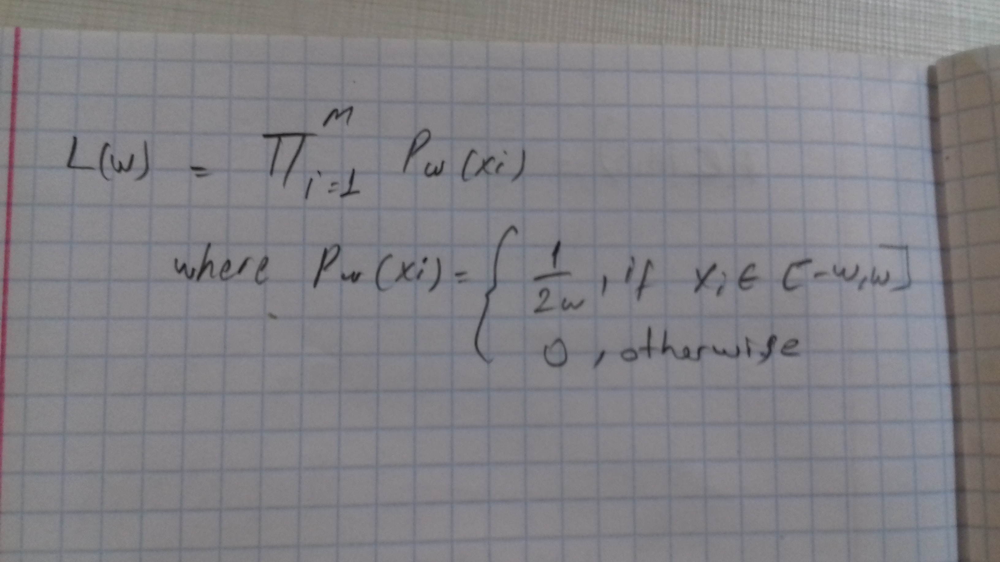

**• Specify the maximum likelihood estimate for w. Consider your answer based on the likelihood function you state.**
    
    Solution: Note that if any xi
    is outside [−w, w], the whole likelihood will be 0. At the same
    time, we would like w to be as small as possible, to maximize 1/(w2). Hence, we should
    pick w to fit both the min and max data point that we are given:
   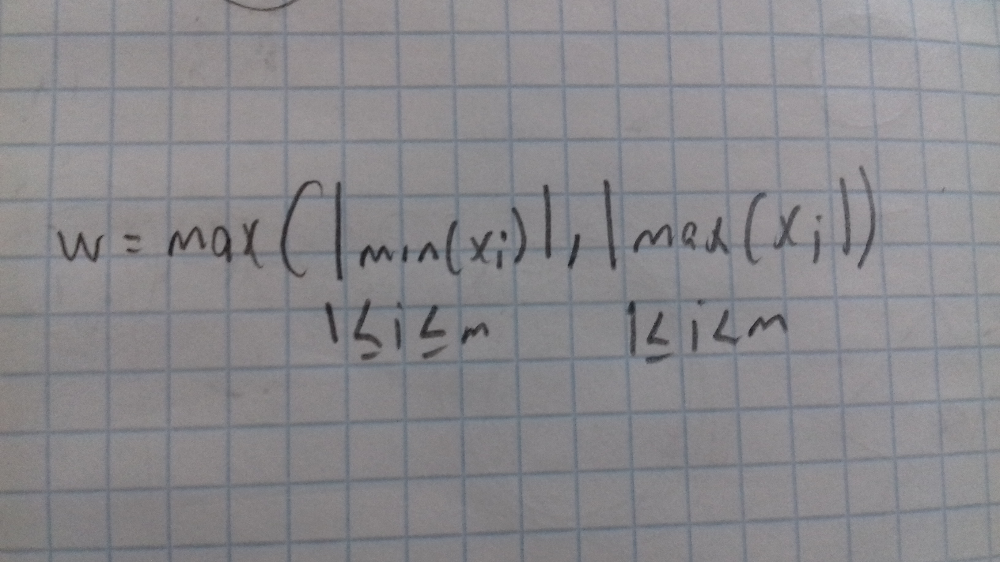
**• Assume that this time you are given a labelled data (xi,yi), where yi is 1 or 0. Remember that a generative classiﬁer will try to model P(y) and P(x|y). Deﬁne an example dataset the generative classiﬁer utilizing the model you deﬁned above for each P(x|y) could not perform well on.** 
    
    Solution: Suppose that you have all the x for the positive class between 0 and some number
    M and all those for the negative class between −M and 0. Then the ML estimate for x for
    both classes will end up with w = M, and as a result, you would always classify the example
    based on the prior over classes. Yet the examples are perfectly separable. The problem here
    stems from the bias of the classifier, which is required to be symmetric.

**• Remember that a discriminative classiﬁer will try to model P(y|x). State that whether you can classify the labelled data given in previously part using such a discriminative classiﬁer or not. If your answer is answer is yes, then please also show that what your suggested classiﬁer looks like.**
    
    Solution: Yes, you could simply pick a threshold and classify based on whether x is larger
    or smaller than the threshold. Note that one could also allow non-symmetric boundaries on
    the distributions, in which case the generative model would work as well.

**2. Fill the blanks with T (True) or F (False) for the statements given above:** 

**• Maximum likelihood estimation provides not only point estimation, but a distribution information of the parameters estimated. (T)**

**• Maximum likelihood and Bayesian approachs for parameter estimation perform well with low-dimensional dataset with many training examples while their performance is bad on high-dimensional dataset with few training examples. (T)**


# Naive Bayes

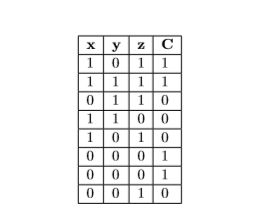

**1. Consider that you are given the dataset in the table above consisting of boolean variables x, y and z and a single boolean output variable C. Suppose that the Naive Bayes classiﬁer is going to be used.**

**• Specify the value of P(C = 1|x = 1,y = 1,z = 0). Show your solution step by step.** 
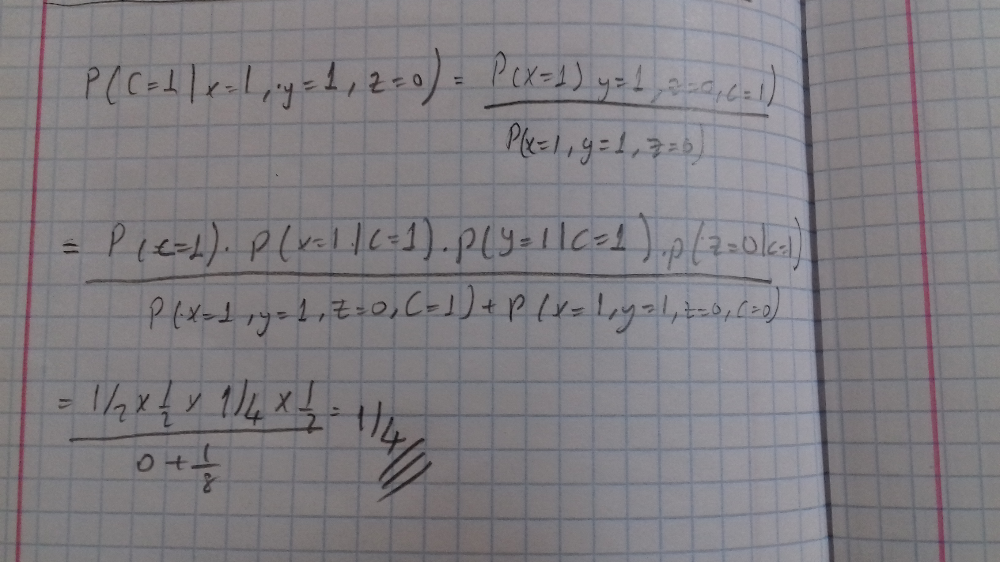
**• Specify the value of P(C = 0|x = 1,y = 1). Show your solution step by step. Now suppose that the Joint Naive Bayes classiﬁer is used for the options below:
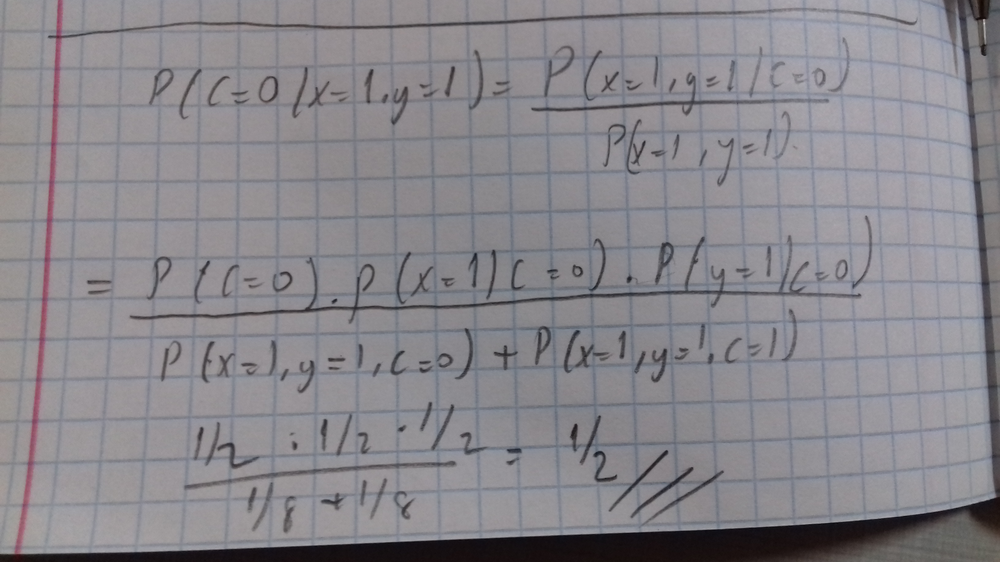
**• Specify the value of P(C = 1|x = 1,y = 1,z = 0). Show your solution step by step.**
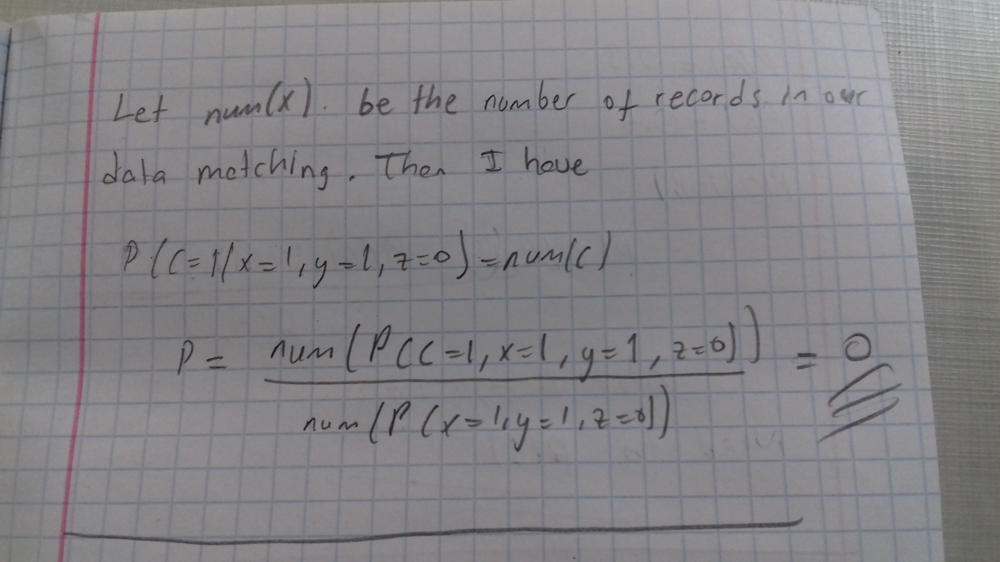
**• Specify the value of P(C = 0|x = 1,y = 1). Show your solution step by step.**
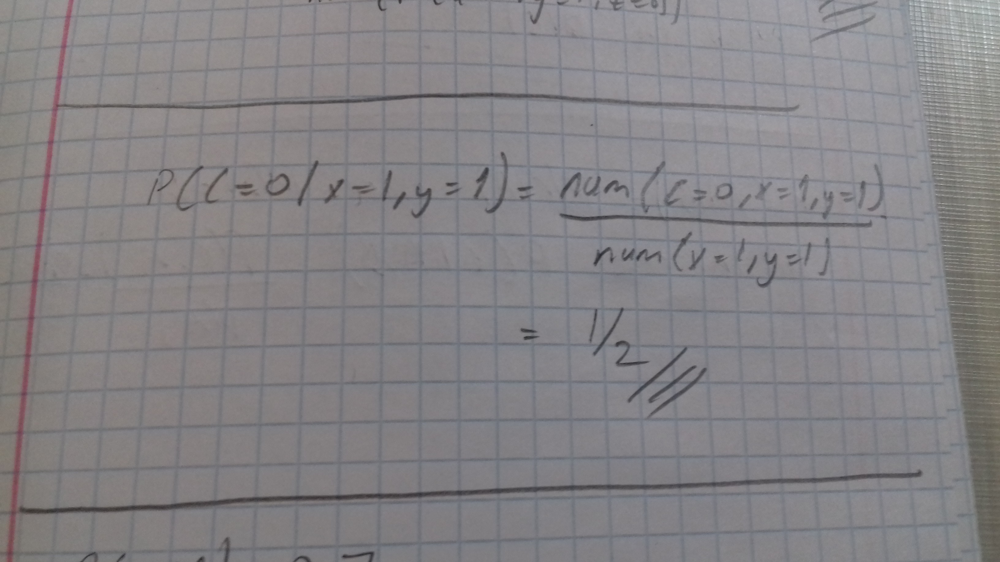

2. Assume that you have three variables, which are A, B and C. 

**• Suppose that you have the following informations P(C|A) = 0.7 and P(C|B) = 0.4. State that whether you can compute P(C|A,B) with the informations given previously or not. Besides show your solution if you can and explain the reason if you can not.**

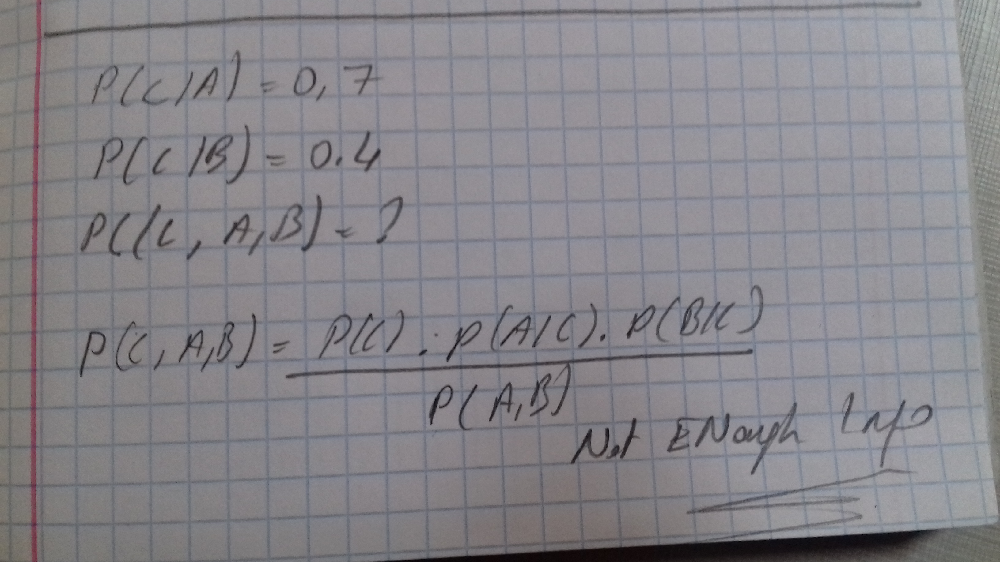

**• Suppose that besides two informations above, P(A) = 0.3 and P(B) = 0.5 informations are given. State that whether you can compute P(C|A,B) with the informations given previously or not. Besides show your solution if you can and explain the reason if you can not. 
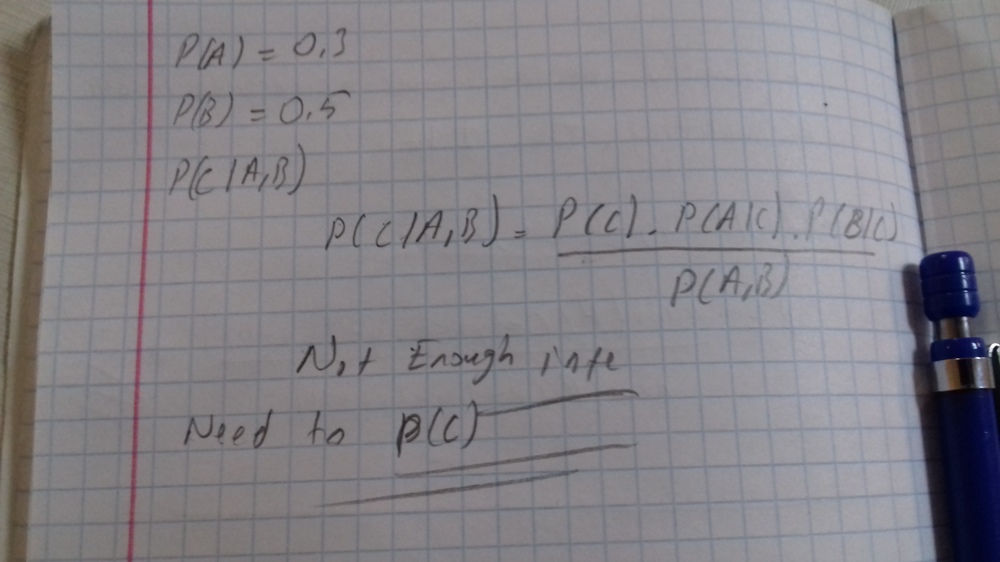
• Finally assume that you have only informations, which are P(C,A) = 0.2, P(A) = 0.3 and P(B) = 1. State that whether you can compute P(C|A,B) with the informations given previously or not. Besides show your solution if you can and explain the reason if you can not.**
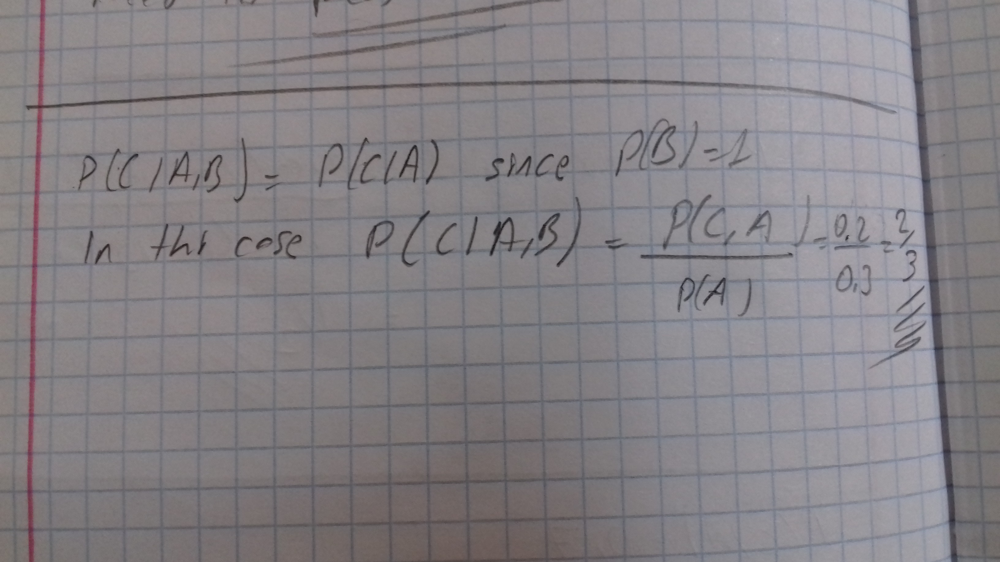

# PART II: Detection of Fake News

In this Assignment we should build a model which one detect news is fake or real.
For this we have a train data and Test data.

In there I import library which one I will use.

In [1]:
import pandas as pd
import numpy as np
from pandas import DataFrame
from sklearn.feature_extraction.text import CountVectorizer
import math 


This function take file then split two part. One part for train data and other part is test data. Then return column which requested. 

In [2]:
def Read_and_Split_TrainFile(columname):
	df=pd.read_csv('fake_news_train.csv',sep=',',names=['id','title','author','text','label'])
	row, column = df.shape
	print("Train data has {} headlines ".format(row))
	#train_df   --->>  Train data
	train_df=df.iloc[  :int(row*99/100),:]
	#train_df   --->>  Test data
	test_df=df.iloc[ int(row*99/100):,:]

	row_train, column_train = train_df.shape
	row_test, column_test = test_df.shape

	#print("Train data size --> {} ".format(row_train))
	#print("Test data  size --> {} ".format(row_test))

	Real_headlines=train_df.loc[train_df['label']=="0", 'title'].values.astype('U')

	Fake_headlines=train_df.loc[train_df['label']=="1", 'title'].values.astype('U')
    
 
	return train_df.loc[train_df['label']=="0", columname].values.astype('U'),train_df.loc[train_df['label']=="1", columname].values.astype('U'),test_df[columname].values.astype('U'),test_df['label'].values.astype('U')


This funtion take text , gram and stopword about that create bag of word then return list of word and CountVectorizer.

In [3]:
def FindMost_Used_Word(headline,gram,stopword=None):
	vec = CountVectorizer(stop_words=stopword,lowercase=True,ngram_range=(gram, gram)).fit(headline)
	bag_of_words= vec.transform(headline)
	sum_words= bag_of_words.sum(axis=0) 
	words_freq = [(word, sum_words[0, idx]) for word, idx in     vec.vocabulary_.items()]
	words_freq=sorted(words_freq, key = lambda x: x[1], reverse=True)

	return words_freq,vec

return how many word in freauency list and how many unique word in this list

In [4]:
def Number_in(words_freq):
	sum_of_word=0
	for w in words_freq:
		sum_of_word+=int(w[1])
	return sum_of_word,len(words_freq)

Check the headline or text is fake or real. for this I use navie bayes theorem

In [5]:
#Part2(words_freq_real_1,words_freq_fake_1,vec_real_1,vec_fake_1,test_headlines,test_labels,1,stopword)
def Part2(words_freq_real,words_freq_fake,vec_real,vec_fake,test_headlines,test_labels,gram,stopword,real_poss,fake_poss):

	number_of_word_real,number_of_uniqe_word_real=Number_in(words_freq_real)
	print("Sum of word passed in Real Headline : {}".format(str(number_of_word_real)))
	print("Number of unique word in Real Headline : {}".format(str(number_of_uniqe_word_real)))
    
	number_of_word_fake,number_of_uniqe_word_fake=Number_in(words_freq_fake)
	print("Sum of word passed in Fake Headline : {}".format(str(number_of_word_fake)))
	print("Number of unique word in Fake Headline : {}".format(str(number_of_uniqe_word_fake)))
	numberof_correct=0
	for i in range(len(test_headlines)):

		try:    
			head_line=test_headlines[i].reshape(1)

			words_freq_test,vec_test= FindMost_Used_Word(head_line,gram,stopword)

			possibilityof_real=0
			possibilityof_fake=0
			new_status="0";
			#print("*************************************headline :",test_headlines[i])
			if(test_headlines[i]!="nan"):
				for word in words_freq_test:
					if vec_real.vocabulary_.get(word[0])!=None:

						count_of_this_word_in_traindata=1
						for real_train in words_freq_real:
							if(real_train[0]==word[0]):
                        
								count_of_this_word_in_traindata=int(real_train[1])
								break
						pay=count_of_this_word_in_traindata+1
						payda=number_of_word_real+number_of_uniqe_word_real
						result=pay/payda
						#result=math.log(result)
						possibilityof_real+=int(word[1])*result
            
						#print("result is :",result)
					if vec_fake.vocabulary_.get(word[0])!=None:

                
						count_of_this_word_in_traindata=1
						for fake_train in words_freq_fake:
							if(fake_train[0]==word[0]):
								"""print("the number of word in fake train data :",fake_train[1])"""

								count_of_this_word_in_traindata=int(fake_train[1])
								break
						pay=count_of_this_word_in_traindata+1
						payda=number_of_word_fake+number_of_uniqe_word_fake
						result=pay/payda
						#result=math.log(result)
						possibilityof_fake+=int(word[1])*result
				if possibilityof_real>possibilityof_fake:

					new_status="0"
				else:
					new_status="1"

				if new_status==test_labels[i]:
					numberof_correct+=1
		except:
			numberof_correct+=0
	print("Number of Correct Headline : {}".format(numberof_correct))
	print("Number of Test data headlines : {}".format(str(len(test_headlines))))

	Accuracy=100*(numberof_correct/len(test_headlines))
	print("Accuracy : {} ".format(Accuracy))

Main Part of program

In [6]:
if __name__== "__main__":

    #Take from function real, fake and test headline ,Also get label of row
	Real_headlines,Fake_headlines,test_headlines,test_labels=Read_and_Split_TrainFile('title')



Train data has 16641 headlines 


Print most three word in Real news title

In [7]:
	print("Most three word in Real News Title")
	words_freq_real_1,vec_real_1=FindMost_Used_Word(Real_headlines,1,'english')
	for i in range(len(words_freq_real_1[:3])):
		print("{}. most used word is : \"{}\" , {} times".format(str(i+1),words_freq_real_1[i][0],words_freq_real_1[i][1]))

Most three word in Real News Title
1. most used word is : "new" , 5318 times
2. most used word is : "york" , 5041 times
3. most used word is : "times" , 5002 times


Print most three word in Fake news title

In [8]:
	print("Most three word in Fake News Title")
	words_freq_fake_1,vec_fake_1=FindMost_Used_Word(Fake_headlines,1,'english')
	for i in range(len(words_freq_fake_1[:3])):
		print("{}. most used word is : \"{}\" , {} times".format(str(i+1),words_freq_fake_1[i][0],words_freq_fake_1[i][1]))

Most three word in Fake News Title
1. most used word is : "trump" , 1163 times
2. most used word is : "hillary" , 813 times
3. most used word is : "clinton" , 701 times


Calculate real and fake news probability in train data

In [9]:
	real_poss=len(Real_headlines)/(len(Real_headlines)+len(Fake_headlines))
	fake_poss=1-real_poss
	print("Possibility of RealHeadline in Train data {} ".format(real_poss))
	print("Possibility of FakeHeadline in Train data {} ".format(fake_poss))

Possibility of RealHeadline in Train data 0.5003338796819037 
Possibility of FakeHeadline in Train data 0.4996661203180963 


Check test data true or fake with 1-gram and stopwords Then print Accuracy.

In [10]:
	Part2(words_freq_real_1,words_freq_fake_1,vec_real_1,vec_fake_1,test_headlines,test_labels,1,'english',real_poss,fake_poss)

Sum of word passed in Real Headline : 76300
Number of unique word in Real Headline : 12745
Sum of word passed in Fake Headline : 59388
Number of unique word in Fake Headline : 13656
Number of Correct Headline : 135
Number of Test data headlines : 167
Accuracy : 80.83832335329342 


Print most word pair in real and fake news without stopwords

In [11]:
	print("Most three word pair in Real News Title")
	words_freq_real_2,vec_real_2=FindMost_Used_Word(Real_headlines,2,'english')
	for i in range(len(words_freq_real_2[:3])):
		print("{}. most used word is : \"{}\" , {} times".format(str(i+1),words_freq_real_2[i][0],words_freq_real_2[i][1]))

	print("Most three word pair in Fake News Title")
	words_freq_fake_2,vec_fake_2=FindMost_Used_Word(Fake_headlines,2,'english')
	for i in range(len(words_freq_fake_2[:3])):
		print("{}. most used word is : \"{}\" , {} times".format(str(i+1),words_freq_fake_2[i][0],words_freq_fake_2[i][1]))

Most three word pair in Real News Title
1. most used word is : "new york" , 5041 times
2. most used word is : "york times" , 4967 times
3. most used word is : "donald trump" , 487 times
Most three word pair in Fake News Title
1. most used word is : "hillary clinton" , 251 times
2. most used word is : "donald trump" , 208 times
3. most used word is : "world war" , 73 times


Check data real or fake with 2-gram then print Accuracy.

In [12]:

	Part2(words_freq_real_2,words_freq_fake_2,vec_real_2,vec_fake_2,test_headlines,test_labels,2,'english',real_poss,fake_poss)

Sum of word passed in Real Headline : 68058
Number of unique word in Real Headline : 47424
Sum of word passed in Fake Headline : 51160
Number of unique word in Fake Headline : 40139
Number of Correct Headline : 136
Number of Test data headlines : 167
Accuracy : 81.437125748503 


# Result Part 2

When I used 1-gram and 2-gram I see I get better result from 2-gram.Cuase of it word have some dependcy. I cant say news fake or real just about number of them in text.We have to looked where this word used. So we can reach a better way. If we used n-gram  and is a big number we couldnot reach a result becasue the model would be rote(ezberlemek) the texts.

Print 10 most used word in text without stopword

In [13]:
	Real_text,Fake_text,test_text,test_labels=Read_and_Split_TrainFile('text')
	print("Most ten word in Real News Text")
	words_freq_real_text,vec_real_text=FindMost_Used_Word(Real_text,1,'english')
	for i in range(len(words_freq_real_text[:10])):
		print("{}. most used word is : \"{}\" , {} times".format(str(i+1),words_freq_real_text[i][0],words_freq_real_text[i][1]))

	print("Most ten word in Fake News Text")
	words_freq_fake_text,vec_fake_text=FindMost_Used_Word(Fake_text,1,'english')
	for i in range(len(words_freq_fake_text[:10])):
		print("{}. most used word is : \"{}\" , {} times".format(str(i+1),words_freq_fake_text[i][0],words_freq_fake_text[i][1]))


Train data has 16641 headlines 
Most ten word in Real News Text
1. most used word is : "said" , 54622 times
2. most used word is : "mr" , 51344 times
3. most used word is : "trump" , 28461 times
4. most used word is : "people" , 15978 times
5. most used word is : "new" , 15561 times
6. most used word is : "president" , 13380 times
7. most used word is : "like" , 12775 times
8. most used word is : "ms" , 9837 times
9. most used word is : "time" , 9551 times
10. most used word is : "just" , 9169 times
Most ten word in Fake News Text
1. most used word is : "trump" , 15908 times
2. most used word is : "clinton" , 14779 times
3. most used word is : "people" , 13028 times
4. most used word is : "hillary" , 10132 times
5. most used word is : "said" , 9352 times
6. most used word is : "just" , 8344 times
7. most used word is : "like" , 8069 times
8. most used word is : "new" , 8060 times
9. most used word is : "time" , 7287 times
10. most used word is : "world" , 7272 times


Calculate text is fake or real without stopword then print Accuracy 

In [14]:
	Part2(words_freq_real_text,words_freq_fake_text,vec_real_text,vec_fake_text,test_text,test_labels,1,'english',real_poss,fake_poss)

Sum of word passed in Real Headline : 3718083
Number of unique word in Real Headline : 88508
Sum of word passed in Fake Headline : 2766215
Number of unique word in Fake Headline : 117555
Number of Correct Headline : 123
Number of Test data headlines : 167
Accuracy : 73.65269461077844 


Print 10 most used word in text with stopword

In [15]:
	print("Most ten word in Real News Text with stopwords")
	words_freq_real_text,vec_real_text=FindMost_Used_Word(Real_text,1,None)
	for i in range(len(words_freq_real_text[:10])):
		print("{}. most used word is : \"{}\" , {} times".format(str(i+1),words_freq_real_text[i][0],words_freq_real_text[i][1]))

	print("Most ten word in Fake News Text with stopwords")
	words_freq_fake_text,vec_fake_text=FindMost_Used_Word(Fake_text,1,None)
	for i in range(len(words_freq_fake_text[:10])):
		print("{}. most used word is : \"{}\" , {} times".format(str(i+1),words_freq_fake_text[i][0],words_freq_fake_text[i][1]))


Most ten word in Real News Text with stopwords
1. most used word is : "the" , 428576 times
2. most used word is : "to" , 195650 times
3. most used word is : "of" , 189142 times
4. most used word is : "and" , 171982 times
5. most used word is : "in" , 151239 times
6. most used word is : "that" , 101787 times
7. most used word is : "for" , 68711 times
8. most used word is : "on" , 66045 times
9. most used word is : "he" , 60742 times
10. most used word is : "is" , 59301 times
Most ten word in Fake News Text with stopwords
1. most used word is : "the" , 299630 times
2. most used word is : "to" , 141999 times
3. most used word is : "of" , 141319 times
4. most used word is : "and" , 130894 times
5. most used word is : "in" , 95443 times
6. most used word is : "that" , 70717 times
7. most used word is : "is" , 64367 times
8. most used word is : "for" , 45775 times
9. most used word is : "it" , 42779 times
10. most used word is : "on" , 37781 times


Calculate text is fake or real with stopword then print Accuracy 

In [16]:
	Part2(words_freq_real_text,words_freq_fake_text,vec_real_text,vec_fake_text,test_text,test_labels,1,None,real_poss,fake_poss)

Sum of word passed in Real Headline : 6916573
Number of unique word in Real Headline : 88814
Sum of word passed in Fake Headline : 5094244
Number of unique word in Fake Headline : 117866
Number of Correct Headline : 82
Number of Test data headlines : 167
Accuracy : 49.101796407185624 


# Result

When used text without stopword I get Accuracy : 73.65269461077844  then with stopwords I get Accuracy : 56.287425149700596.In this result we can see stopword not show us true result cause the stopword can be any where. For example in a long text we have more stopword if all fake news is long and real news is short stopword will say to us always news is fake casue of stopword.If you have stopword text is fake. And we dont want it. Stopword common word and can be anywhere.
    Also we can say that stopword have same number in real and fake news. Most 10  word in used in fake and real news is same so stopword can not show us anythings. 
